In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Import Required Libraries**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

import plotly.express as px
import plotly.graph_objects as go

In [ ]:
file_path="/content/drive/MyDrive/Loan_default.csv"


**Load Dataset**

In [ ]:
# Load Dataset
df = pd.read_csv(file_path)

# Display First 5 Rows
print(df.head())

# Dataset Information
print(df.info())

# Check Missing Values
print(df.isnull().sum())

       LoanID  Age  Income  LoanAmount  CreditScore  MonthsEmployed  \
0  I38PQUQS96   56   85994       50587          520              80   
1  HPSK72WA7R   69   50432      124440          458              15   
2  C1OZ6DPJ8Y   46   84208      129188          451              26   
3  V2KKSFM3UN   32   31713       44799          743               0   
4  EY08JDHTZP   60   20437        9139          633               8   

   NumCreditLines  InterestRate  LoanTerm  DTIRatio    Education  \
0               4         15.23        36      0.44   Bachelor's   
1               1          4.81        60      0.68     Master's   
2               3         21.17        24      0.31     Master's   
3               3          7.07        24      0.23  High School   
4               4          6.51        48      0.73   Bachelor's   

  EmploymentType MaritalStatus HasMortgage HasDependents LoanPurpose  \
0      Full-time      Divorced         Yes           Yes       Other   
1      Full-time    

**Select Important Columns**

In [ ]:
selected_columns = [
    'LoanAmount',
    'LoanTerm',
    'InterestRate',
    'Income',
    'MonthsEmployed',
    'HasMortgage',
    'LoanPurpose',
    'Default' # 'loan_status' is 'Default' in this dataset
]

df = df[selected_columns].copy()

**Data Cleaning & Preprocessing**

In [ ]:
print("\nMissing Values:")
print(df.isnull().sum())
df.dropna(inplace=True)


Missing Values:
LoanAmount        0
LoanTerm          0
InterestRate      0
Income            0
MonthsEmployed    0
HasMortgage       0
LoanPurpose       0
Default           0
dtype: int64


**Descriptive Statistics**

In [ ]:
print("\nAverage Loan Amount:")
print(df['LoanAmount'].mean())

print("\nAverage Annual Income:")
print(df['Income'].mean())

print("\nInterest Rate Statistics:")
print(df['InterestRate'].describe())


Average Loan Amount:
127578.86551242035

Average Annual Income:
82499.30459727351

Interest Rate Statistics:
count    255347.000000
mean         13.492773
std           6.636443
min           2.000000
25%           7.770000
50%          13.460000
75%          19.250000
max          25.000000
Name: InterestRate, dtype: float64


**Default Behavior Analysis**

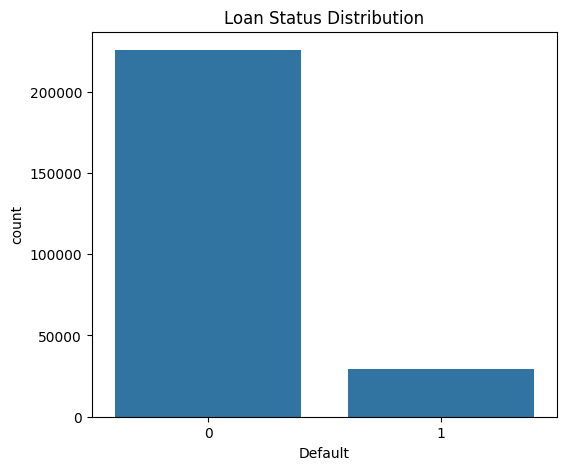


Loan Status Count:
Default
0    225694
1     29653
Name: count, dtype: int64


In [ ]:
default_counts = df['Default'].value_counts()

plt.figure(figsize=(6,5))
sns.countplot(x='Default', data=df)
plt.title("Loan Status Distribution")
plt.show()

print("\nLoan Status Count:")
print(default_counts)

**Group-Based Analysis**

In [ ]:
income_default = df.groupby('Default')['Income'].mean()
print("\nIncome vs Loan Status:")
print(income_default)
emp_default = df.groupby('Default')['MonthsEmployed'].mean()
print("\nEmployment Length vs Loan Status:")
print(emp_default)
home_default = pd.crosstab(df['HasMortgage'], df['Default'])
print("\nHome Ownership vs Default:")
print(home_default)
purpose_default = pd.crosstab(df['LoanPurpose'], df['Default'])
print("\nPurpose vs Default:")
print(purpose_default)


Income vs Loan Status:
Default
0    83899.165995
1    71844.722659
Name: Income, dtype: float64

Employment Length vs Loan Status:
Default
0    60.764721
1    50.235457
Name: MonthsEmployed, dtype: float64

Home Ownership vs Default:
Default           0      1
HasMortgage               
No           111909  15761
Yes          113785  13892

Purpose vs Default:
Default          0     1
LoanPurpose             
Auto         44803  6041
Business     44975  6323
Education    44967  6038
Home         46037  5249
Other        44912  6002


**Relationship Analysis**

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


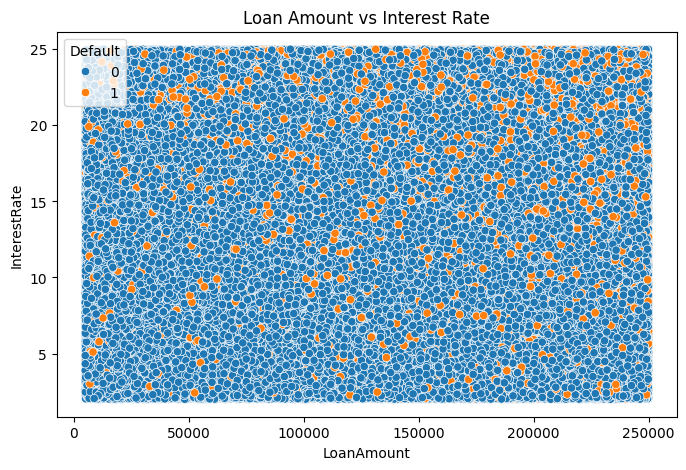

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


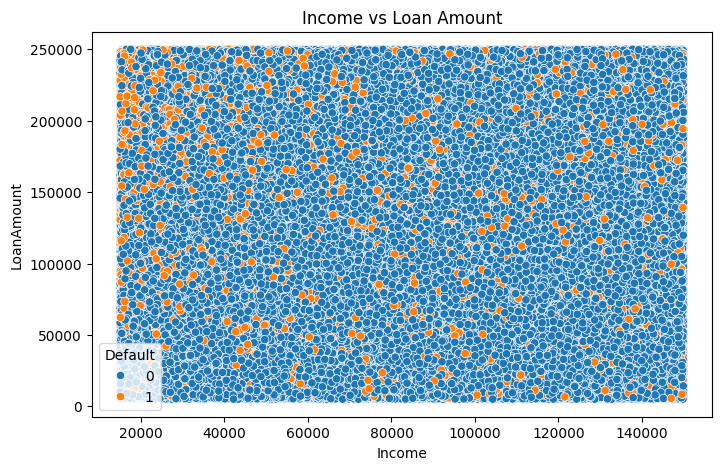

In [ ]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='LoanAmount', y='InterestRate', hue='Default', data=df)
plt.title("Loan Amount vs Interest Rate")
plt.show()
plt.figure(figsize=(8,5))
sns.scatterplot(x='Income', y='LoanAmount', hue='Default', data=df)
plt.title("Income vs Loan Amount")
plt.show()

**Histogram**

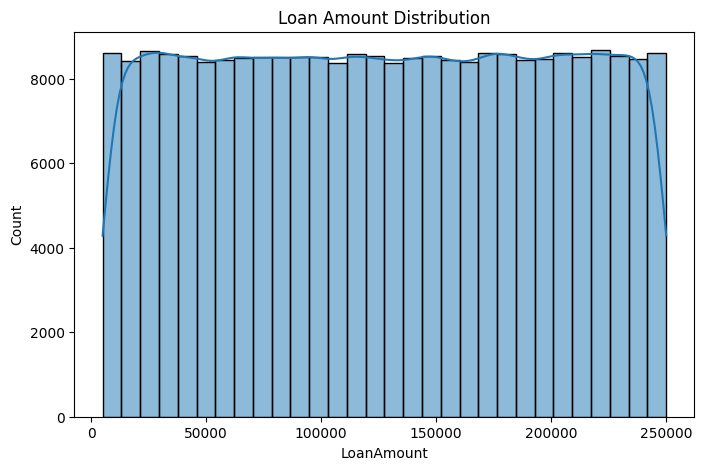

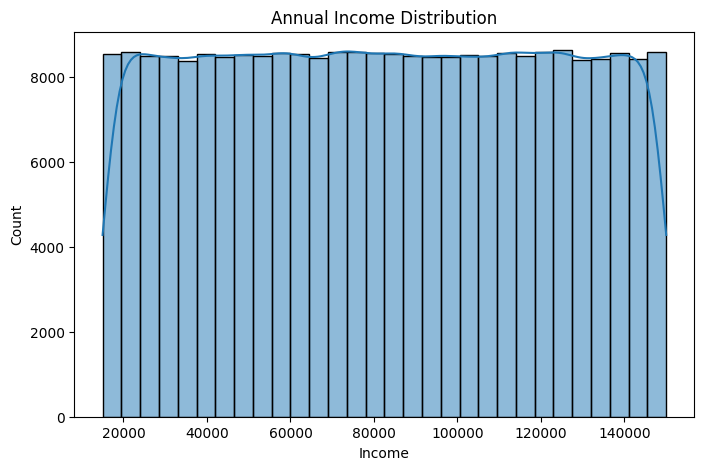

In [ ]:
plt.figure(figsize=(8,5))
sns.histplot(df['LoanAmount'], bins=30, kde=True)
plt.title("Loan Amount Distribution")
plt.show()
plt.figure(figsize=(8,5))
sns.histplot(df['Income'], bins=30, kde=True)
plt.title("Annual Income Distribution")
plt.show()

**Box Plot**

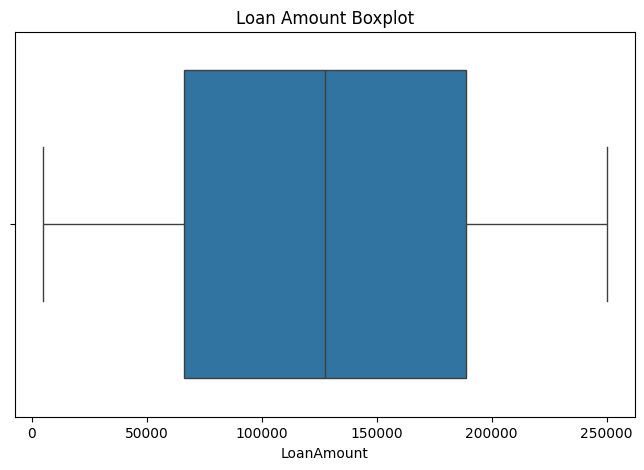

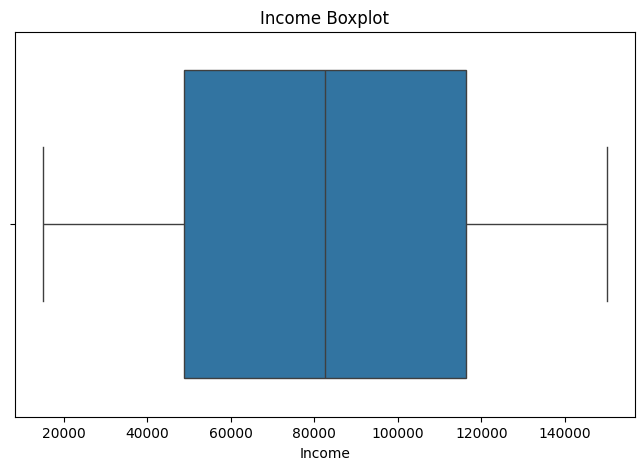

In [ ]:
plt.figure(figsize=(8,5))
sns.boxplot(x=df['LoanAmount'])
plt.title("Loan Amount Boxplot")
plt.show()
plt.figure(figsize=(8,5))
sns.boxplot(x=df['Income'])
plt.title("Income Boxplot")
plt.show()

**Correlation Heatmap**

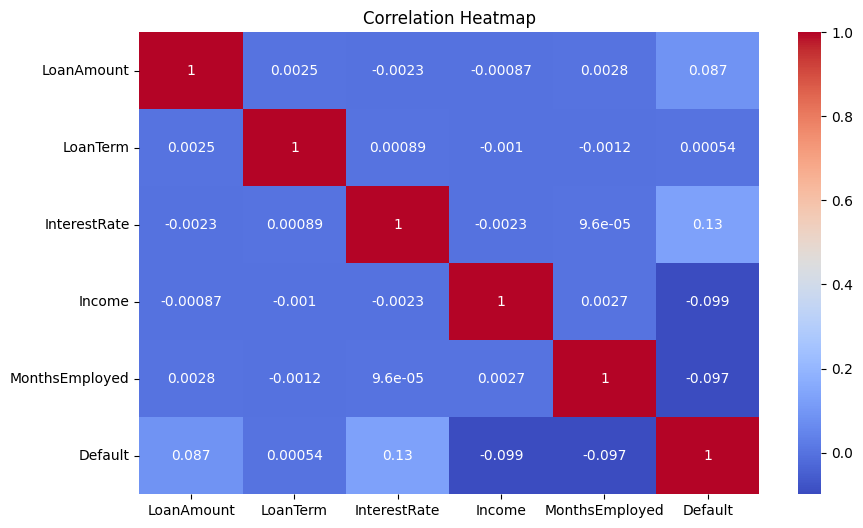

In [ ]:
numeric_df = df.select_dtypes(include=np.number)

plt.figure(figsize=(10,6))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()

**Risk Classification**

In [ ]:
def classify_risk(rate):
    if rate < 10:
        return "Low Risk"
    elif rate < 20:
        return "Medium Risk"
    else:
        return "High Risk"

df['Risk_Level'] = df['InterestRate'].apply(classify_risk)

print("\nRisk Level Counts:")
print(df['Risk_Level'].value_counts())


Risk Level Counts:
Risk_Level
Medium Risk    110921
Low Risk        88825
High Risk       55601
Name: count, dtype: int64


**Linear Regression Model**

In [ ]:
X = df[['Income', 'InterestRate', 'LoanTerm']]
y = df['LoanAmount']
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

**Model Evaluation**

In [ ]:
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print("\nModel Evaluation")
print("----------------------")
print("R2 Score:", r2)
print("MAE:", mae)
print("RMSE:", rmse)


Model Evaluation
----------------------
R2 Score: -3.488513906479973e-05
MAE: 61363.59481299828
RMSE: 70784.33933512791


**Residual Analysis**

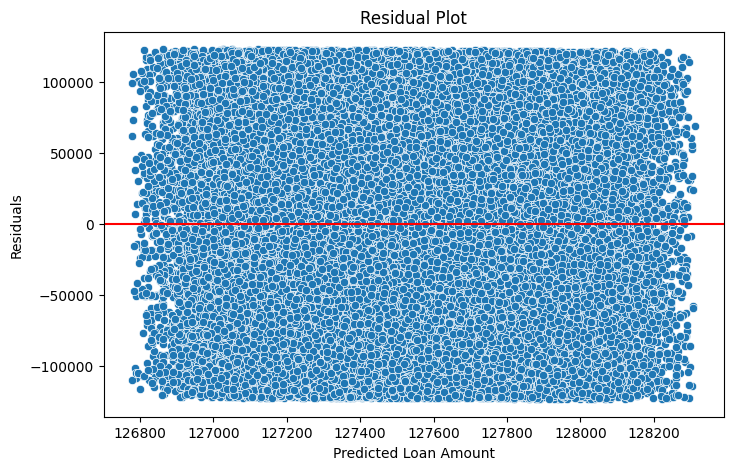

In [ ]:
residuals = y_test - y_pred

plt.figure(figsize=(8,5))
sns.scatterplot(x=y_pred, y=residuals)
plt.axhline(y=0, color='red')
plt.title("Residual Plot")
plt.xlabel("Predicted Loan Amount")
plt.ylabel("Residuals")
plt.show()

**Dashboard Creation using Plotly**

In [39]:
fig1 = px.scatter(
    df,
    x='Income',
    y='LoanAmount',
    color='Default',
    title='Income vs Loan Amount'
)

fig1.show()
fig2 = px.histogram(
    df,
    x='LoanAmount',
    color='Default',
    title='Loan Amount Distribution'
)

fig2.show()
fig3 = px.box(
    df,
    x='Default',
    y='InterestRate',
    color='Default',
    title='Interest Rate vs Loan Status'
)

fig3.show()
fig4 = px.bar(
    df,
    x='HasMortgage',
    color='Default',
    title='Default Comparison by Home Ownership'
)

fig4.show()